In [1]:
from numqt import *

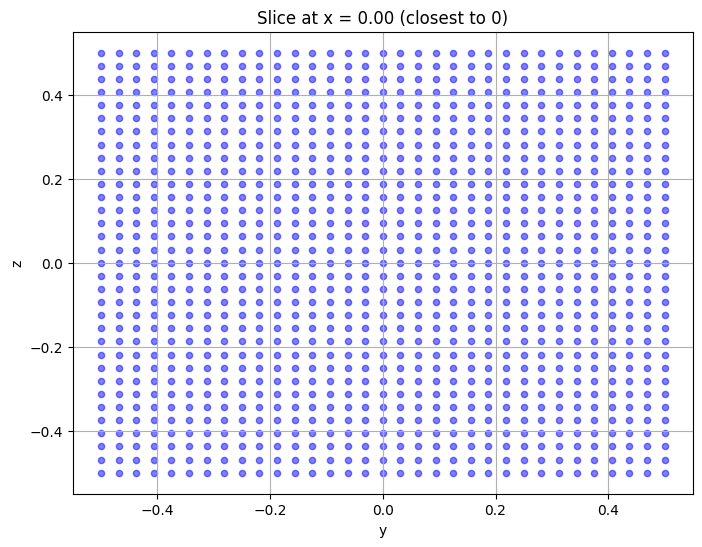

33 33 33


In [11]:
#-----------------------------------------------------------
# Characteristic lengths of the problem
#-----------------------------------------------------------
Lx = 1 # Characteristic length along x
Ly = 1 # Characteristic length along y
Lz = 1 # Characteristic length along z

#-----------------------------------------------------------
# Problem's parameters
#-----------------------------------------------------------
hbar = 1
m = 1 # e-mass

#-----------------------------------------------------------
# Simulation parameters
#-----------------------------------------------------------
xbounds = (-Lx/2, Lx/2) # confinement length
ybounds = (-Ly/2, Ly/2) # confinement length
zbounds = (-Lz/2, Lz/2) # confinement length


dx = 0.03 # spacing
dy = 0.03 # spacing
dz = 0.03 # spacing

nx = int(np.abs(xbounds[1] - xbounds[0]) / dx)
ny = int(np.abs(ybounds[1] - ybounds[0]) / dy)
nz = int(np.abs(zbounds[1] - zbounds[0]) / dz)

#-----------------------------------------------------------
# Creating grid
#-----------------------------------------------------------
mesh_obj = Mesh(dims=3,
                xbounds=xbounds,
                ybounds=ybounds,
                zbounds=zbounds,
                nx=nx, 
                ny=ny,
                nz=nz)


dimx = mesh_obj.Nx
dimy = mesh_obj.Ny
dimz = mesh_obj.Nz
mesh_obj.visualize_slice("x", 0, alpha = 0.5)
print(dimx, dimy, dimz)

In [12]:
#-----------------------------------------------------------
# Obtaining canonical operators
#-----------------------------------------------------------
operators = canonic_ops(mesh_obj, additional_subspaces = None, hbar=1)
px2 = operators.get_ops()["p2"][0]
py2 = operators.get_ops()["p2"][1]
pz2 = operators.get_ops()["p2"][2]


#-----------------------------------------------------------
# Constructing the Hamiltonian
#-----------------------------------------------------------
H = Hamiltonian((px2 + py2 + pz2) / (2*m), mesh_obj)

In [13]:
k = 100
energies, wavefunctions = H.solve(k)

In [16]:
H.plot(2)

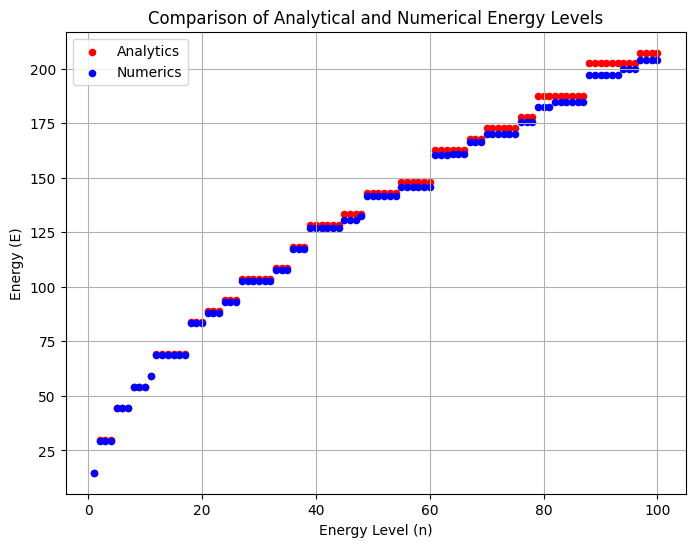

In [17]:
# Define the analytical energy function
def energy(nx, ny, nz):
    return nx**2 * np.pi**2 * hbar**2  / (2 * m * Lx**2) + ny**2 * np.pi**2 * hbar**2  / (2 * m * Ly**2) + nz**2 * np.pi**2 * hbar**2  / (2 * m * Lz**2)

# Generate analytical energy levels
analytical_energies = sorted([energy(nx, ny, nz) for nx in range(1, k+1) for ny in range(1, k+1) for nz in range(1, k+1)])[:k]

# Plot
plt.figure(figsize=(8, 6))
plt.scatter(range(1, k+1), analytical_energies, c="r", s=20, label="Analytics")
plt.scatter(range(1, k+1), energies, c="b", s=20, label="Numerics")
plt.legend()
plt.ylabel("Energy (E)")
plt.xlabel("Energy Level (n)")
plt.title("Comparison of Analytical and Numerical Energy Levels")
plt.grid(True)

plt.show()